In [ ]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import os
from Pipelines import *

matplotlib.rcParams['font.family'] = 'Arial'
plt.style.use('seaborn-v0_8-talk')

## Get Adata

In [ ]:
base_dir = "/project/cfRNA_Disentaglement/Data/OpenAccess/Processed"
var = pd.read_table("./Data/GECODEv49_Annot.tsv", index_col=0)
palangodb = pd.read_table("./Data/PalangoDB_CellTypeMarkers.tsv")
obs = pd.read_csv("./Data/OpenAccess/Processed/Meta_Processed.csv", index_col=0)
orig_counts = pd.read_csv("./Data/OpenAccess/Processed/Merged_featureCounts.csv", index_col=0)

In [ ]:
cohorts = obs['BioProject'].unique()
print(f"Detected Cohorts: {cohorts}")

def load_and_concat_cohorts(base_dir, suffix, obs_index, var_index=None):
    df_list = []
    for cohort in cohorts:
        filename = f"Norm_{cohort}_{suffix}.csv"
        file_path = os.path.join(base_dir, filename)
        if os.path.exists(file_path):
            df = pd.read_csv(file_path, index_col=0).T
            df_list.append(df)
        else:
            print(f"  [Warning] Missing file for {cohort}: {filename}")
    if not df_list:
        raise FileNotFoundError(f"No files found for suffix: {suffix}")

    full_df = pd.concat(df_list, axis=0)
    if var_index is not None:
        full_df = full_df.reindex(index=obs_index, columns=var_index).fillna(0)
    else:
        full_df = full_df.reindex(index=obs_index).fillna(0)
        
    return full_df

print("\nProcessing Raw Counts to initialize AnnData using 'orig_counts'...")
try:
    df_raw = orig_counts.T
    if var is not None:
        df_raw = df_raw.reindex(index=obs.index, columns=var.index).fillna(0)

    # 3. AnnData 생성
    adata = sc.AnnData(X=df_raw.values.astype(np.float32), obs=obs, var=var)
    
    # 4. layers['counts']에 원본 저장
    adata.layers['counts'] = adata.X.copy()
    
    print(f"AnnData Initialized: {adata.shape}")
    # --------------------------------------------------------------------------

except Exception as e:
    print(f"Critical Error initializing AnnData: {e}")
    exit(1)
    
norm_layers = {
    "log_TMM": "TMM_log2",
    "log_TPM": "TPM_log2",
    "log_FPKM": "FPKM_log2",
    "EDA_Full": "EDA_Full_All", 
    "EDA+RUVg_k1": "Proposed_Full_k1",
    "EDA+RUVg_k2": "Proposed_Full_k2",
    "EDA+RUVg_k3": "Proposed_Full_k3",
    "RUVg_k1": "RUVg_Platelet_k1",
    "RUVg_k2": "RUVg_Platelet_k2",
    "RUVg_k3": "RUVg_Platelet_k3",
}

for layer_name, file_suffix in norm_layers.items():
    print(f"Processing Layer: {layer_name} (Suffix: {file_suffix})...")
    try:
        # Normalization 파일들은 여전히 함수를 통해 불러옴
        df_norm = load_and_concat_cohorts(base_dir, file_suffix, adata.obs_names, adata.var_names)
        # print(df_norm.shape) # 주석 처리 혹은 필요시 사용
        
        # AnnData 레이어에 할당
        adata.layers[layer_name] = df_norm.values.astype(np.float32)
        print(f"  -> Added {layer_name}")
        
    except Exception as e:
        print(f"  [Error] Failed to add {layer_name}: {e}")

print("\nFinalizing...")

for col in adata.obs.columns:
    if adata.obs[col].dtype == 'object':
        adata.obs[col] = adata.obs[col].astype(str)
        
        
temp = sc.AnnData(X=adata.layers['counts'].copy())
sc.pp.normalize_total(temp, target_sum=1e6)
sc.pp.log1p(temp)
adata.layers['Standard_LogCPM'] = temp.X
print("Baseline created.")

platelet_sigs = palangodb[palangodb['cell type'] == 'Platelets']
adata.var['is_platelet'] = False
adata.var.loc[adata.var['GeneName'].isin(platelet_sigs['official gene symbol']), 'is_platelet'] = True
adata.var['log10_Length'] = np.log10(adata.var['Length'])
print("Platelet Signature Annotated.")

NameError: name 'obs' is not defined

In [8]:
from Pipelines import calculate_bias_metrics

biases = calculate_bias_metrics(adata, layer='Standard_LogCPM')
biases

--- Calculating Bias Metrics (Target Layer: Standard_LogCPM) ---
  > Computing GC bias score (LOESS)...
  > Computing Length bias score (Spearman)...
  > Computing Platelet scores (127 genes)...
Calculation Done.



,gc_bias_score,len_bias_score,platelet_score,total_counts,log1p_total_counts
1,0,0,0.0,0.0,0.0
2,0,0,0.0,0.0,0.0
3,0,0,0.0,0.0,0.0
4,0,0,0.0,0.0,0.0
5,0,0,0.0,0.0,0.0
...,...,...,...,...,...
2178,0,0,0.0,0.0,0.0
2179,0,0,0.0,0.0,0.0
2180,0,0,0.0,0.0,0.0
2181,0,0,0.0,0.0,0.0


In [7]:
adata.write_h5ad("./Data/OpenAccess/Processed/Merged.h5ad")

## PCA

In [6]:
adata = sc.read_h5ad("./Data/OpenAccess/Processed/Merged.h5ad")

In [3]:
pipeline = RNASeqQCPipeline(
    adata=adata,              
    gene_type_col='GeneType',       
    target_types=['protein_coding'], 
    phenotype_col='Type_Granular',           
    batch_col='Batch_Granular',              
    gc_col='GC_Percent',           
    len_col='Length',              
    platelet_col='is_platelet'    
)
pipeline.set_layer('Standard_LogCPM')

--- [Step 1] Preparing Metadata & Filtering ---
Filtered for ['protein_coding']: 20097 genes left.
Preparation Done.
--- Initializing: Using baseline layer 'Standard_LogCPM' for Bias Calculation ---
--- [Step] Calculating Bias Metrics ---
  > Computing GC bias score (LOESS)...
  > Computing Length bias score (Spearman)...
  > Computing Platelet scores...
Bias Metrics Calculation Done.
--- Set Layer: Switching to 'Standard_LogCPM' ---
PCA reset. Active layer is now ready for analysis.
--- Set Layer: Switching to 'Standard_LogCPM' ---
PCA reset. Active layer is now ready for analysis.


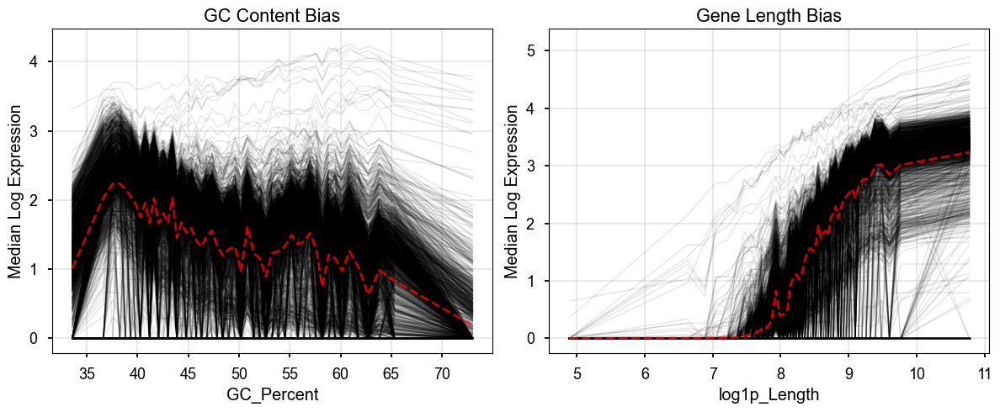

In [4]:
def plot_bias_patterns(adata, feature_key, n_bins=50, ax=None, title=None):
    # 1. Data Prep
    feat = adata.var[feature_key]
    valid = feat.notna()
    X = adata[:, valid].X
    feat = feat[valid]

    bins = pd.qcut(feat, q=n_bins, duplicates='drop')
    intervals = sorted(bins.unique())
    x_centers = [i.mid for i in intervals]
    
    sample_trends = []
    for b in intervals:
        mask = (bins == b).values
        bin_medians = np.median(X[:, mask], axis=1)
        sample_trends.append(bin_medians)
        
    df = pd.DataFrame(sample_trends, index=x_centers, columns=adata.obs_names)

    ax.plot(df.index, df.values, color='k', alpha=0.1, lw=1)
    ax.plot(df.index, df.mean(axis=1), color='r', alpha=0.8, lw=2, ls='--', label='Global Mean')
    ax.set_title(title if title else f"Bias: {feature_key}")
    ax.set_xlabel(feature_key)
    ax.set_ylabel("Median Log Expression")
    ax.grid(alpha=0.3)
    return ax

# --- Execution ---
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
adata = pipeline.adata.copy()
adata.var['log1p_Length'] = np.log1p(adata.var['Length'])

plot_bias_patterns(adata, 'GC_Percent', ax=axes[0], title="GC Content Bias") 
plot_bias_patterns(adata, 'log1p_Length', ax=axes[1], title="Gene Length Bias") 

plt.tight_layout()
plt.show()

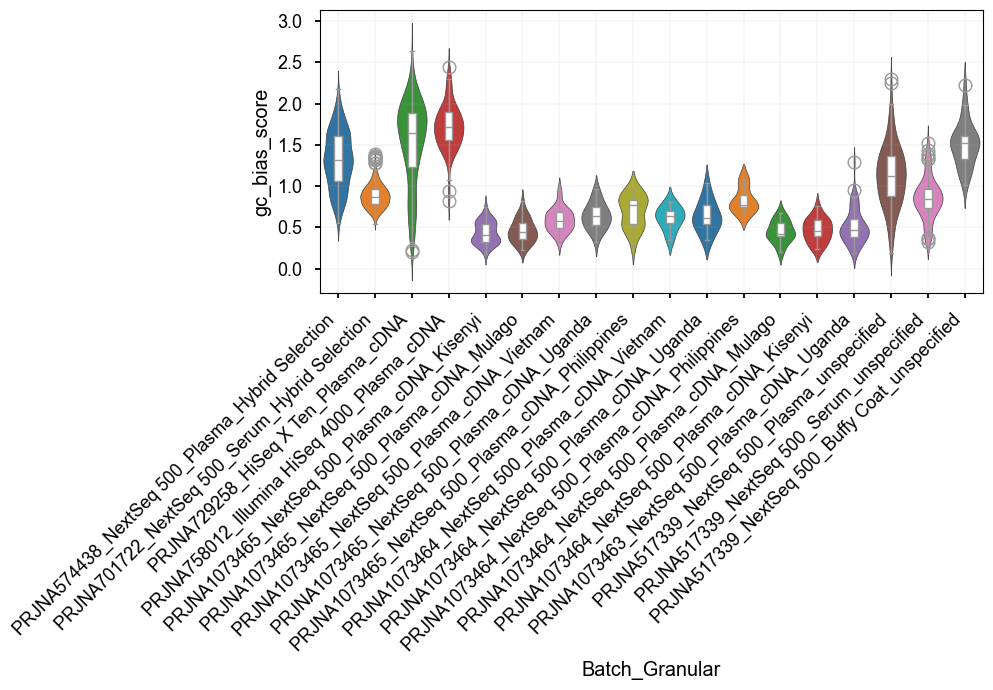

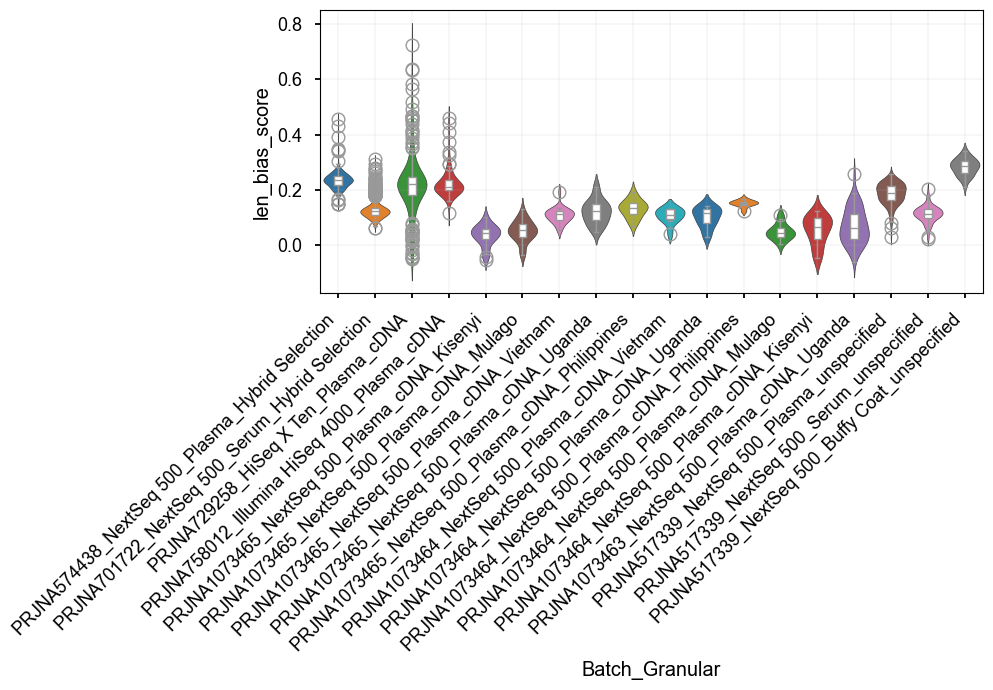

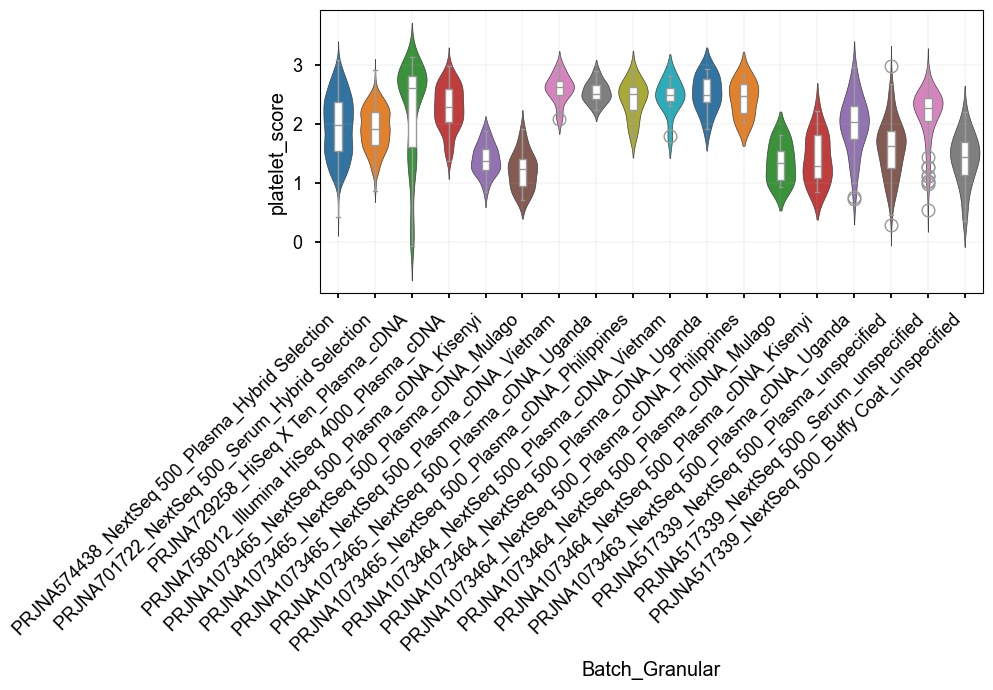

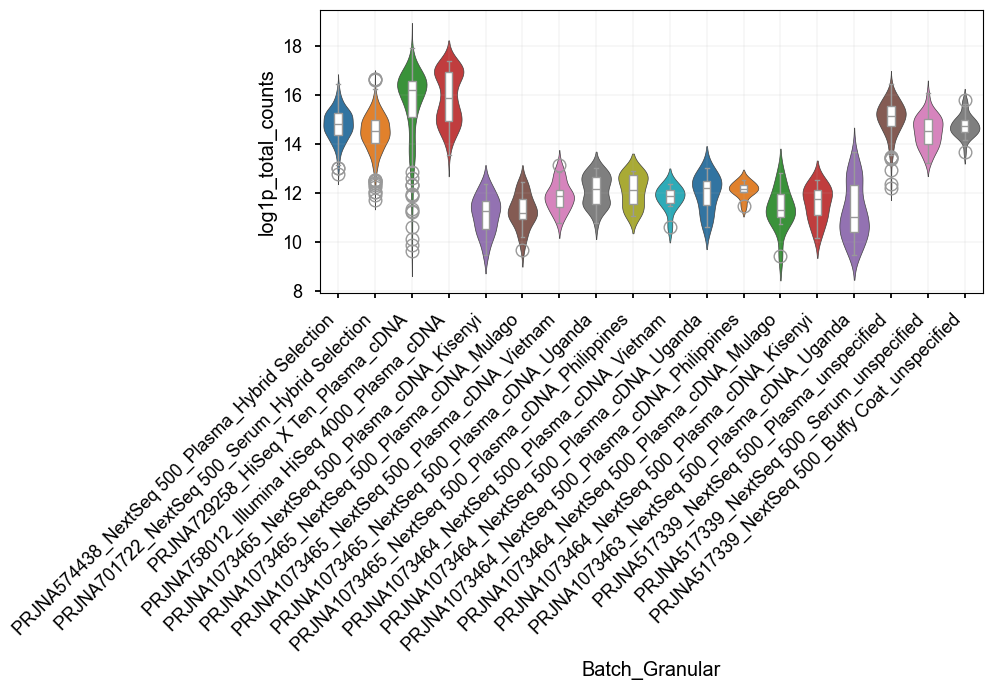

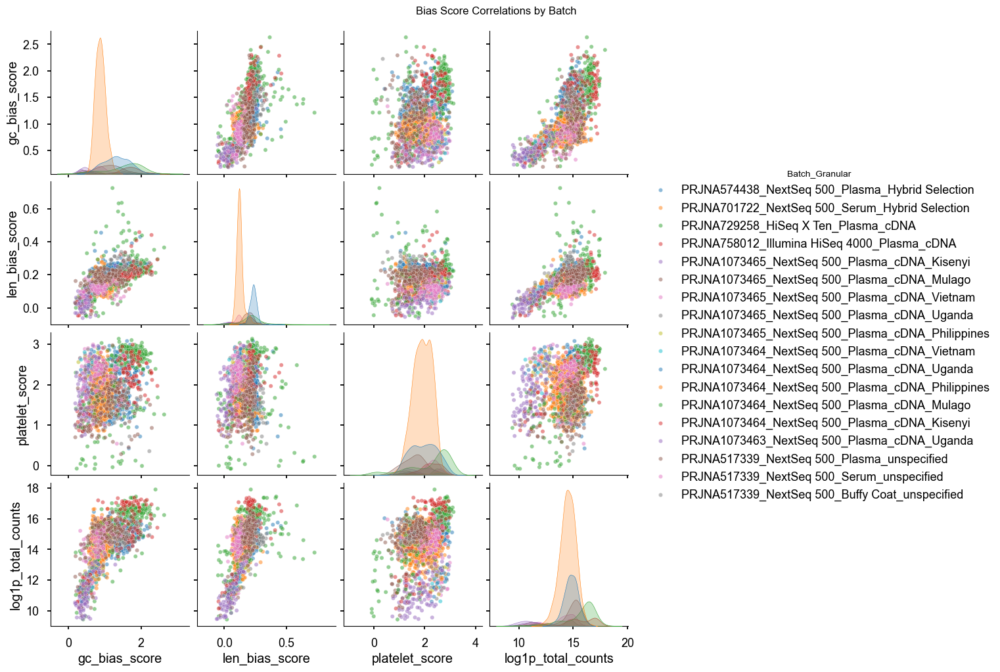

### Univariate Statistical Analysis (Batch Effect) ###
           Bias_Score  KW_Statistic  p-value  Eta_Squared Effect_Size_Class
0       gc_bias_score     1151.4669      0.0       0.5233             Large
1      len_bias_score     1345.9549      0.0       0.6130             Large
2      platelet_score      489.9762      0.0       0.2182             Large
3  log1p_total_counts      928.9356      0.0       0.4206             Large


In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.spatial.distance import pdist, squareform
try:
    from skbio.stats.distance import permanova
    from skbio import DistanceMatrix
    has_skbio = True
except ImportError:
    has_skbio = False
    
df_obs = pipeline.adata.obs.copy()
bias_cols = pipeline.get_metric_keys()
batch_col = 'Batch_Granular'
def plot_bias_distribution(df, bias_cols, batch_col):
    for col in bias_cols:
        plt.figure(figsize=(10, 7))
        ax = sns.violinplot(x=batch_col, y=col, data=df, inner=None, color=".8", hue=batch_col, palette='tab10')
        sns.boxplot(x=batch_col, y=col, data=df, width=0.2, ax=ax,
                    boxprops={'zorder': 2}, color="white")
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.grid(alpha=0.1)
        plt.show()

def plot_bias_correlations(df, bias_cols, batch_col):
    g = sns.pairplot(df[bias_cols + [batch_col]], 
                     hue=batch_col, 
                     diag_kind="kde", 
                     plot_kws={'alpha': 0.5, 's': 20},
                     palette="tab10")
    
    g.fig.suptitle("Bias Score Correlations by Batch", y=1.02)
    plt.show()

def run_permanova_analysis(df, bias_cols, batch_col):
    if not has_skbio:
        print("Error: scikit-bio is not installed.")
        return None

    bias_z = df[bias_cols].apply(stats.zscore)
    clean_data = bias_z.join(df[batch_col]).dropna()
    
    if clean_data.empty:
        print("No data available after dropping NaNs.")
        return None

    bias_matrix = clean_data[bias_cols]
    grouping = clean_data[batch_col]

    dm = pdist(bias_matrix, metric='euclidean')
    dm_sq = squareform(dm)
    dist_matrix = DistanceMatrix(dm_sq, ids=clean_data.index)
    perm_results = permanova(dist_matrix, grouping=grouping, permutations=9999)
    summary_data = {
        "Test_Method": "PERMANOVA (Euclidean)",
        "Grouping_Var": batch_col,
        "N_Samples": int(perm_results['sample size']),
        "N_Groups": int(perm_results['number of groups']),
        "Pseudo_F": perm_results['test statistic'], # 효과 크기 지표 (클수록 그룹 간 차이 큼)
        "p_value": perm_results['p-value'],
        "Permutations": perm_results['number of permutations']
    }
    
    res_df = pd.DataFrame([summary_data])
    def get_sig_star(p):
        if p < 0.001: return '***'
        elif p < 0.01: return '**'
        elif p < 0.05: return '*'
        else: return 'ns'
        
    res_df['Sig'] = res_df['p_value'].apply(get_sig_star)
    cols_order = ["Test_Method", "Grouping_Var", "N_Samples", "N_Groups", "Pseudo_F", "p_value", "Sig", "Permutations"]
    res_df = res_df[cols_order]

    return res_df

def kruskal_wallis_test(df, bias_cols, batch_col):
    results = []
    for col in bias_cols:
        # 1. Kruskal-Wallis Test
        groups = [group[col].values for name, group in df.groupby(batch_col)]
        H, p = stats.kruskal(*groups)
        
        # 2. Effect Size (Eta-squared for H-statistic)
        # Formula: (H - k + 1) / (n - k)
        # k: number of groups, n: total observations
        k = len(groups)
        n = len(df)
        eta_sq = (H - k + 1) / (n - k)
        
        # 음수 보정 (아주 드물게 발생 가능)
        eta_sq = max(0, eta_sq)
        
        results.append({
            'Bias_Score': col,
            'KW_Statistic': H,
            'p-value': p,
            'Eta_Squared': eta_sq,
            'Effect_Size_Class': 'Large' if eta_sq > 0.14 else ('Medium' if eta_sq > 0.06 else 'Small')
        })

    stats_df = pd.DataFrame(results)
    print("### Univariate Statistical Analysis (Batch Effect) ###")
    print(stats_df.round(4))
    return stats_df 

plot_bias_distribution(df_obs, bias_cols, batch_col)
plot_bias_correlations(df_obs, bias_cols, batch_col)
permanova_stats = run_permanova_analysis(df_obs, bias_cols, batch_col)
kruskal_stats = kruskal_wallis_test(df_obs, bias_cols, batch_col)

In [8]:
permanova_stats

,Test_Method,Grouping_Var,N_Samples,N_Groups,Pseudo_F,p_value,Sig,Permutations
0,PERMANOVA (Euclidean),Batch_Granular,2186,18,122.506107,0.0001,***,9999


In [9]:
kruskal_stats

,Bias_Score,KW_Statistic,p-value,Eta_Squared,Effect_Size_Class
0,gc_bias_score,1151.466915,3.328802e-234,0.523278,Large
1,len_bias_score,1345.954921,6.270066e-276,0.612987,Large
2,platelet_score,489.976238,2.442594e-93,0.218162,Large
3,log1p_total_counts,928.935581,1.400326e-186,0.420634,Large


Plotting gc_bias_score ...


/tmp/ipykernel_84268/103385874.py:122: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


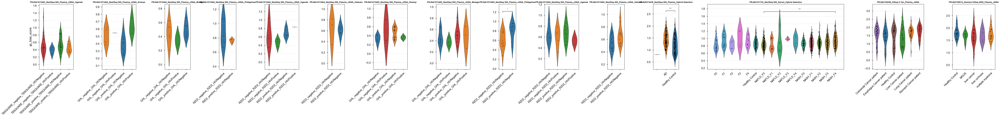

Plotting len_bias_score ...


/tmp/ipykernel_84268/103385874.py:122: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


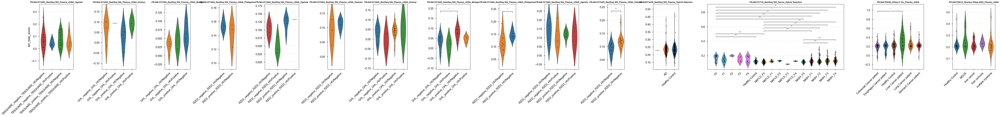

Plotting platelet_score ...


/tmp/ipykernel_84268/103385874.py:122: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


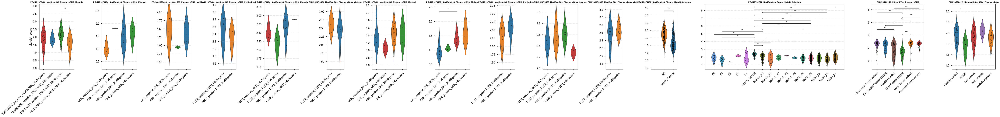

Plotting log1p_total_counts ...


/tmp/ipykernel_84268/103385874.py:122: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


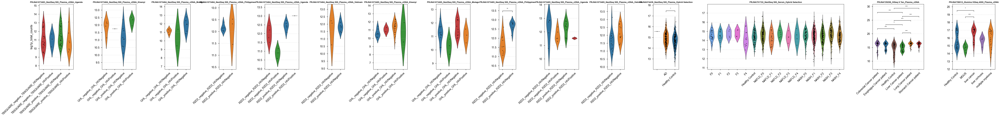

In [13]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from itertools import combinations
import math

obs = pipeline.adata.obs.copy()
bias_metrics = ['gc_bias_score', 'len_bias_score', 'platelet_score','log1p_total_counts']
batch_col = 'Batch_Granular'
pheno_col = 'Type_Granular'
def add_stat_annotation(ax, data, x, y, order, pairs, test='Wilcoxon', text_format='star', p_threshold=0.05):
    y_min, y_max = ax.get_ylim()
    y_range = y_max - y_min
    line_height = y_range * 0.02
    text_height = y_range * 0.02
    step_height = y_range * 0.08 
    
    current_y = y_max 

    group_max = data.groupby(x)[y].max()
    current_y = group_max.max() + (y_range * 0.1)

    significant_combinations = []
    
    for pair in pairs:
        g1, g2 = pair
        d1 = data[data[x] == g1][y]
        d2 = data[data[x] == g2][y]

        if len(d1) < 2 or len(d2) < 2: continue

        # --- 통계 검정 (Wilcoxon Rank-Sum) ---
        try:
            stat, p_val = stats.ranksums(d1, d2)
        except ValueError:
            continue
            
        # --- Bonferroni Correction ---
        adj_p_val = p_val * len(pairs)
        if adj_p_val > 1.0: adj_p_val = 1.0
        
        if adj_p_val < p_threshold:
            significant_combinations.append(((g1, g2), adj_p_val))

    significant_combinations.sort(key=lambda x: abs(order.index(x[0][0]) - order.index(x[0][1])))

    for (g1, g2), p_val in significant_combinations:
        x1 = order.index(g1)
        x2 = order.index(g2)
        
        # 별표 생성
        if p_val < 0.001: star = '***'
        elif p_val < 0.01: star = '**'
        elif p_val < 0.05: star = '*'
        else: star = 'ns'
        
        if text_format == 'full':
            text = f"p={p_val:.1e}"
        else:
            text = star

        bar_y = current_y + step_height

        ax.plot([x1, x1, x2, x2], [bar_y, bar_y + line_height, bar_y + line_height, bar_y], 
                lw=1.0, c='black')
        
        ax.text((x1 + x2) / 2, bar_y + line_height + text_height, text, 
                ha='center', va='bottom', color='black', fontsize=10)
        
        current_y = bar_y + line_height + text_height

    ax.set_ylim(y_min, current_y + (y_range * 0.1))

batch_counts = obs.groupby(batch_col)[pheno_col].nunique()
valid_batches = batch_counts[batch_counts > 1].index.tolist()
valid_batches.sort()

if not valid_batches:
    print("비교 가능한 배치가 없습니다.")
else:
    for metric in bias_metrics:
        batch_group_counts = [obs[obs[batch_col]==b][pheno_col].nunique() for b in valid_batches]
        
        total_width = sum(batch_group_counts) * 0.8 + len(valid_batches) # 여백 포함
        if total_width < 6: total_width = 6 # 최소 너비 보장
        
        fig, axes = plt.subplots(1, len(valid_batches), 
                                 figsize=(total_width, 8), 
                                 gridspec_kw={'width_ratios': batch_group_counts},
                                 constrained_layout=True)
        
        if len(valid_batches) == 1: axes = [axes]
        
        print(f"Plotting {metric} ...")

        for ax, batch in zip(axes, valid_batches):
            subset = obs[obs[batch_col] == batch].copy()
            
            local_order = sorted(subset[pheno_col].unique())
            
            sns.violinplot(data=subset, x=pheno_col, y=metric, order=local_order,
                           ax=ax, hue=pheno_col, inner=None, linewidth=1., width=0.6)
            
            sns.stripplot(data=subset, x=pheno_col, y=metric, order=local_order,
                          ax=ax, color='black', alpha=0.5, size=4, jitter=True)

            combs = list(combinations(local_order, 2))
            add_stat_annotation(ax, subset, x=pheno_col, y=metric, 
                                order=local_order, pairs=combs,
                                test='Wilcoxon', text_format='star') # 'star' or 'full'
            
            ax.set_title(f"{batch}", fontweight='bold', fontsize=10)
            ax.set_xlabel("")
            ax.set_ylabel(metric if ax == axes[0] else "") # 첫 번째만 y라벨 표시
            
            ax.set_xticks(range(len(local_order)))
            ax.set_xticklabels(local_order, rotation=45, ha='right', rotation_mode='anchor')
            ax.grid(axis='y', linestyle='--', alpha=0.3)

        plt.tight_layout()
        plt.show()


 Processing: PRJNA574438
--- [Step 1] Preparing Metadata & Filtering ---
Filtered for ['protein_coding']: 19726 genes left.
Preparation Done.
--- Initializing: Using baseline layer 'Standard_LogCPM' for Bias Calculation ---
--- [Step] Calculating Bias Metrics ---
  > Computing GC bias score (LOESS)...
  > Computing Length bias score (Spearman)...
  > Computing Platelet scores...
Bias Metrics Calculation Done.
--- Set Layer: Switching to 'Standard_LogCPM' ---
PCA reset. Active layer is now ready for analysis.
--- Set Layer: Switching to 'Standard_LogCPM' ---
PCA reset. Active layer is now ready for analysis.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


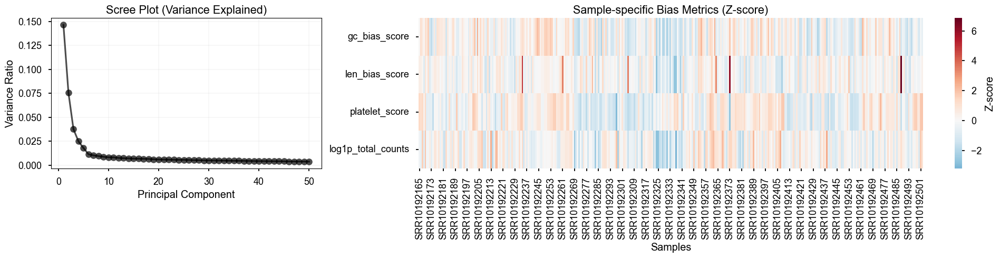

--- [Step 2-2] PCA Scatter Plots ---


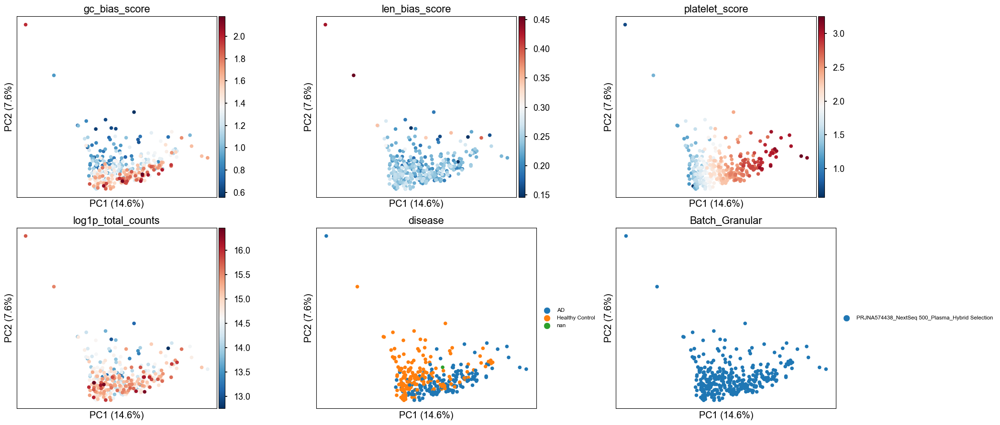

Skipping ANOVA for Batch_Granular: only one group present.


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2

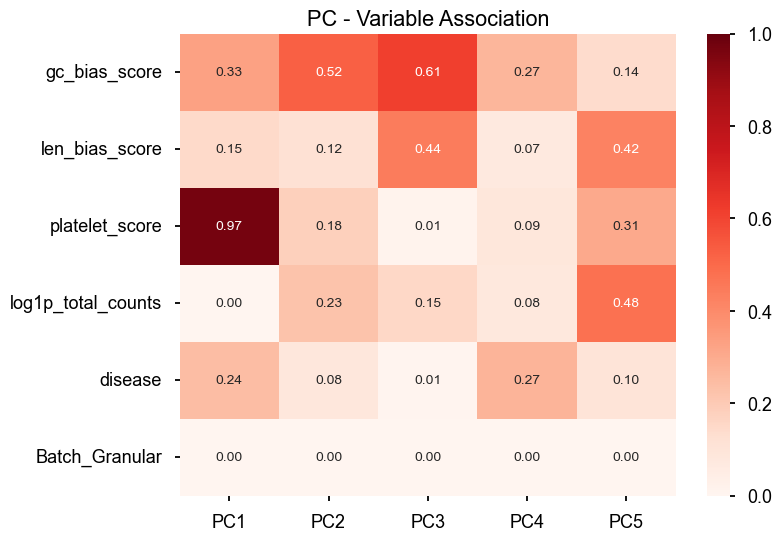

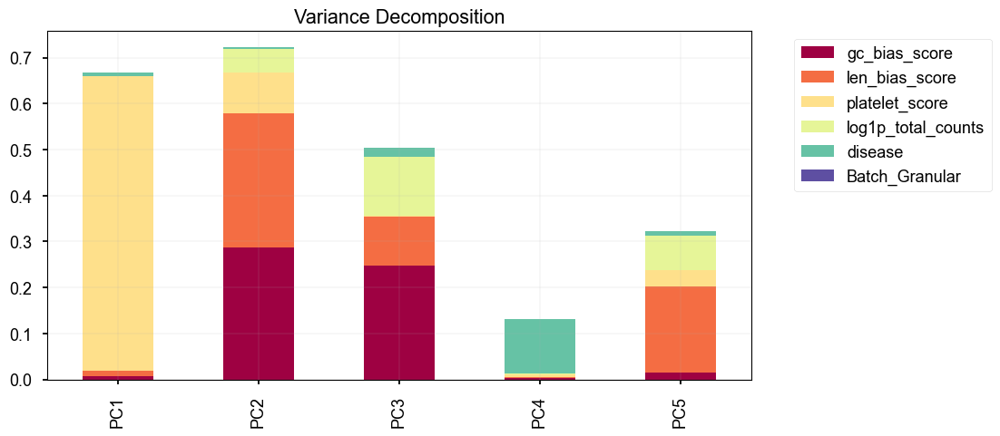

--- [Step 6] Partial Correlation Analysis ---


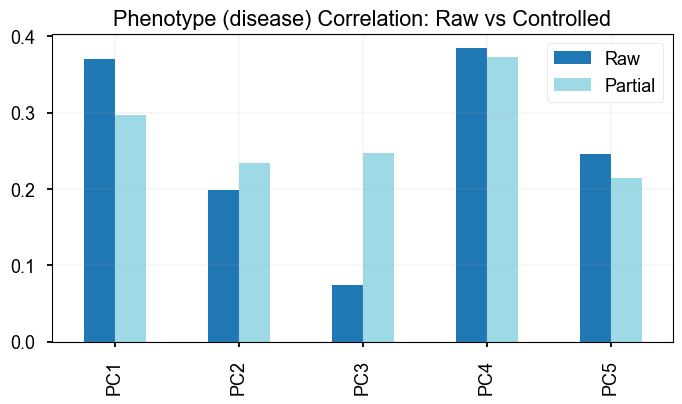

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['gc_bias_score', 'len_bias_score', 'log1p_total_counts']


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '


   -> Regressing out: ['platelet_score']
   -> Applying ComBat on 'Batch_Granular'


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '


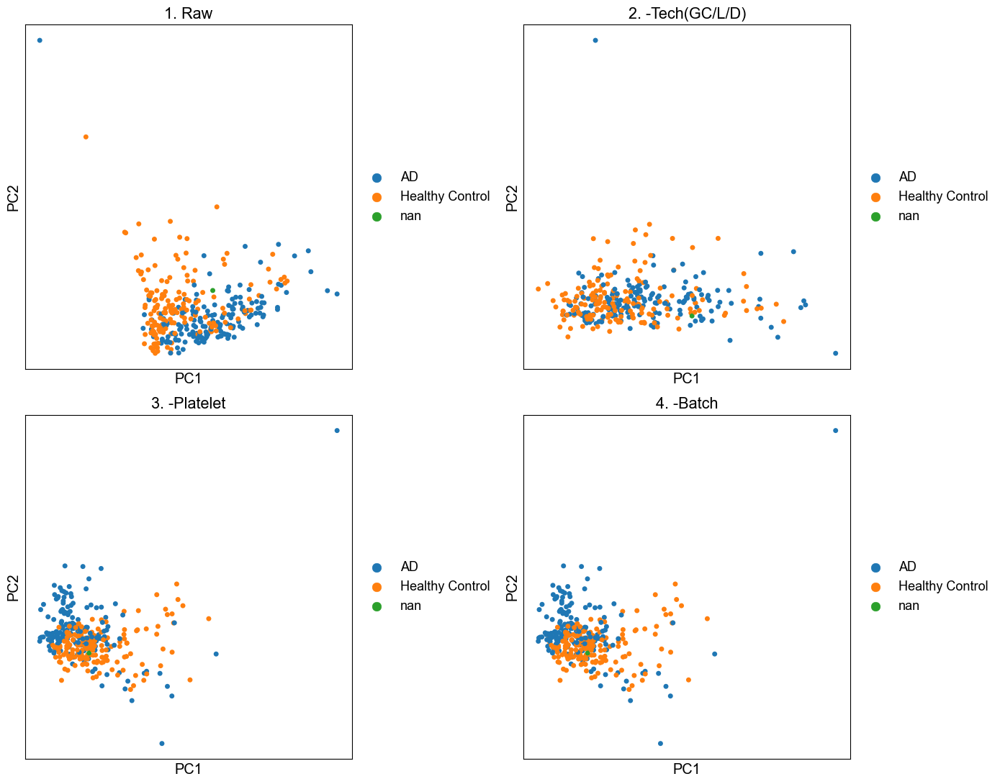

Displaying Metric Evolution (Spearman/ANOVA)...


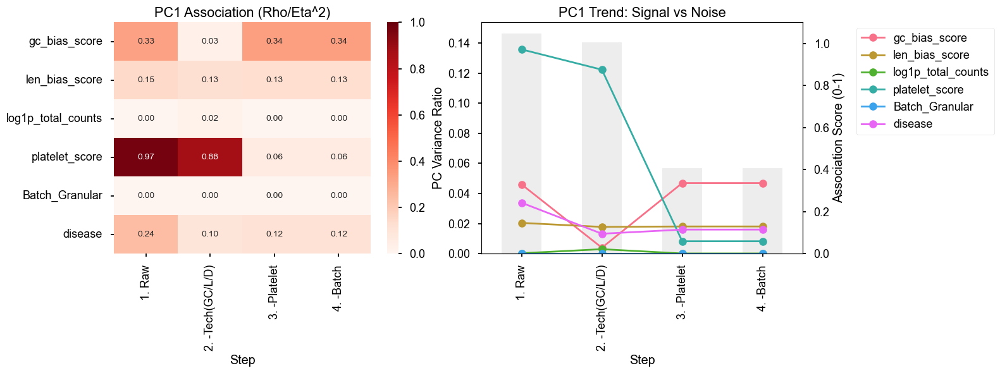

--- Finished Analysis for PRJNA574438 ---

 Processing: PRJNA701722
--- [Step 1] Preparing Metadata & Filtering ---
Filtered for ['protein_coding']: 19454 genes left.
Preparation Done.
--- Initializing: Using baseline layer 'Standard_LogCPM' for Bias Calculation ---
--- [Step] Calculating Bias Metrics ---
  > Computing GC bias score (LOESS)...
  > Computing Length bias score (Spearman)...
  > Computing Platelet scores...
Bias Metrics Calculation Done.
--- Set Layer: Switching to 'Standard_LogCPM' ---
PCA reset. Active layer is now ready for analysis.
--- Set Layer: Switching to 'Standard_LogCPM' ---
PCA reset. Active layer is now ready for analysis.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


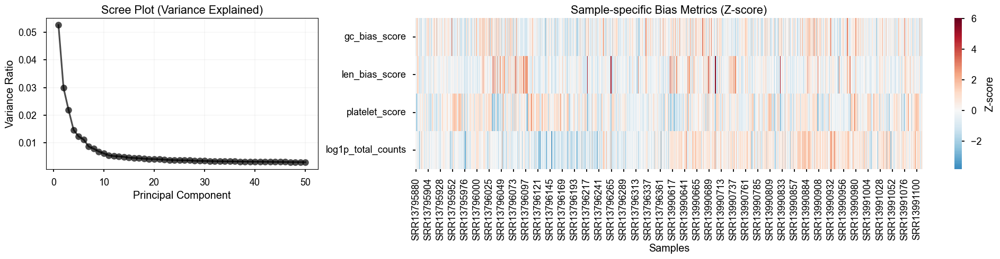

--- [Step 2-2] PCA Scatter Plots ---


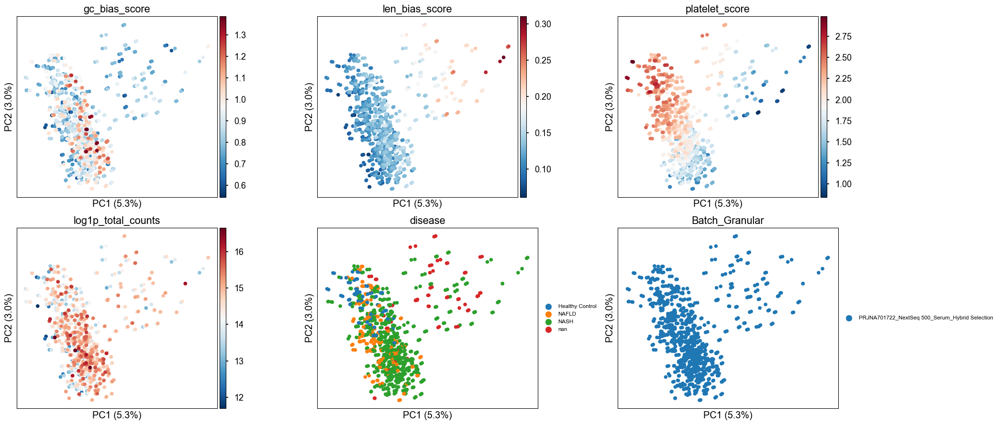

Skipping ANOVA for Batch_Granular: only one group present.


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 2
  warnings.warn('covariance of constraints does not have full '
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 2
  warnings.warn('covariance of constraints does not have full '
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 2
  warnings.warn('covariance of constraints does not have full '
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3

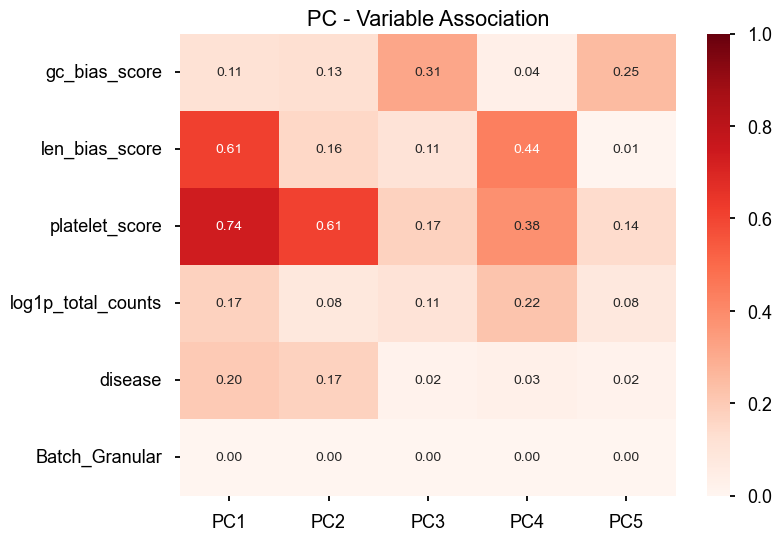

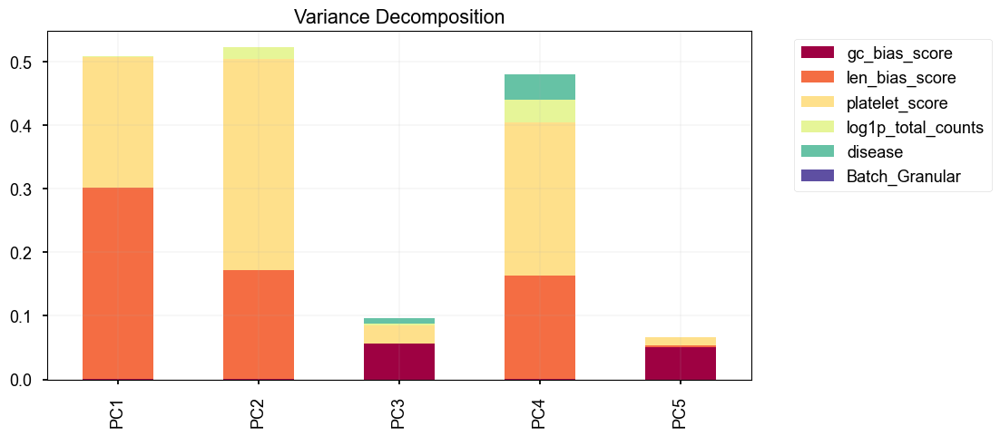

--- [Step 6] Partial Correlation Analysis ---


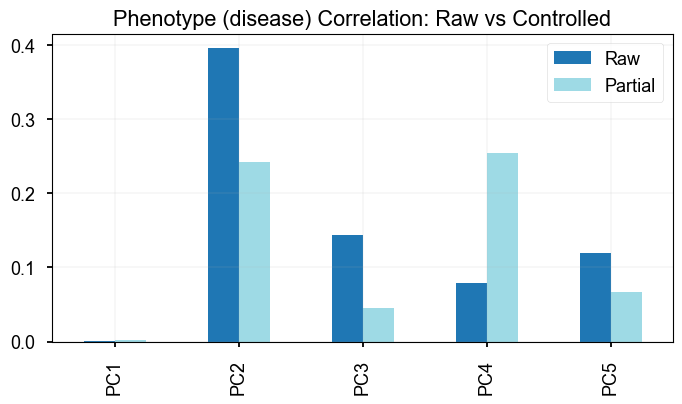

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 2
  warnings.warn('covariance of constraints does not have full '


   -> Regressing out: ['gc_bias_score', 'len_bias_score', 'log1p_total_counts']


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 2
  warnings.warn('covariance of constraints does not have full '


   -> Regressing out: ['platelet_score']


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 2
  warnings.warn('covariance of constraints does not have full '


   -> Applying ComBat on 'Batch_Granular'


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 2
  warnings.warn('covariance of constraints does not have full '


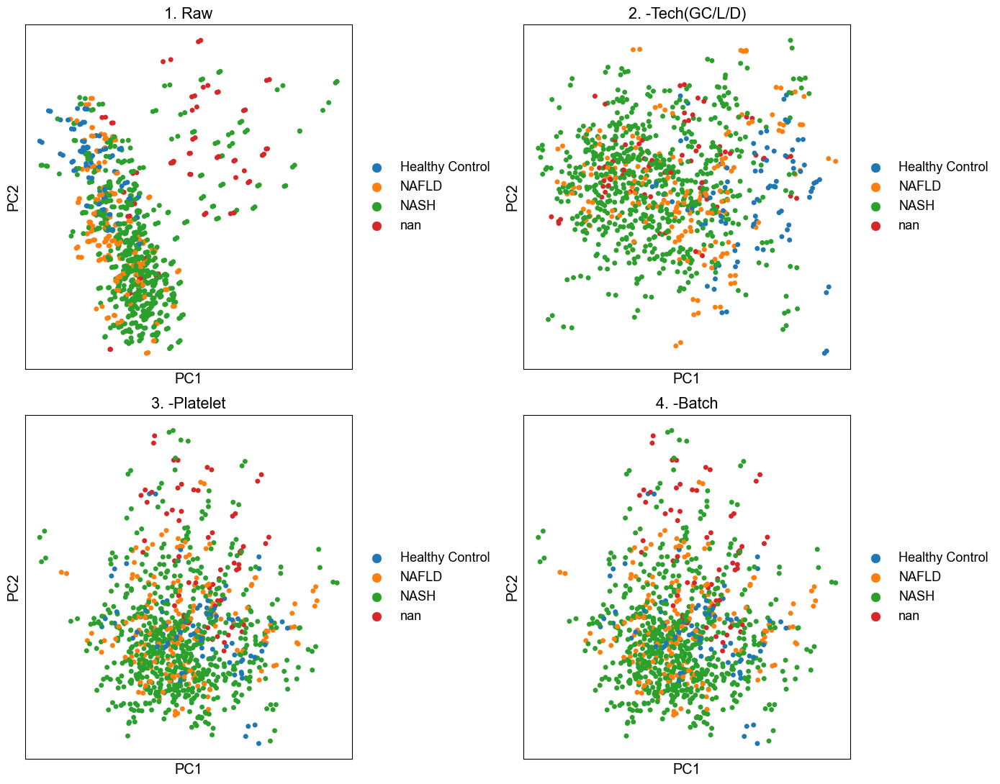

Displaying Metric Evolution (Spearman/ANOVA)...


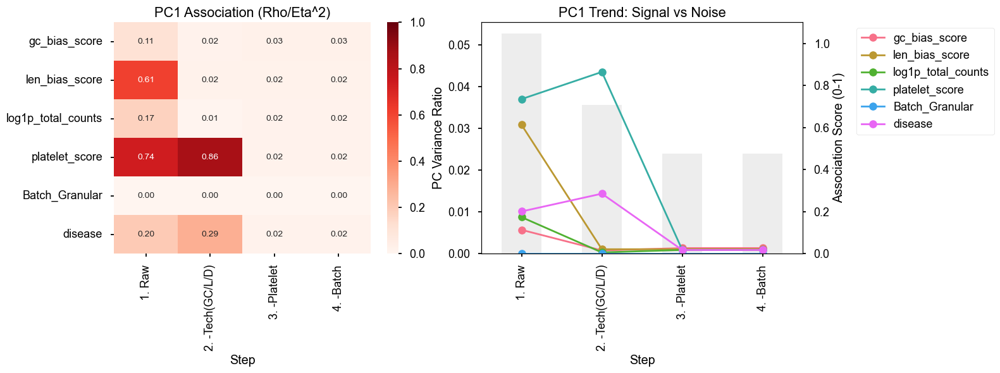

--- Finished Analysis for PRJNA701722 ---

 Processing: PRJNA729258
--- [Step 1] Preparing Metadata & Filtering ---
Filtered for ['protein_coding']: 19758 genes left.
Preparation Done.
--- Initializing: Using baseline layer 'Standard_LogCPM' for Bias Calculation ---
--- [Step] Calculating Bias Metrics ---
  > Computing GC bias score (LOESS)...
  > Computing Length bias score (Spearman)...
  > Computing Platelet scores...
Bias Metrics Calculation Done.
--- Set Layer: Switching to 'Standard_LogCPM' ---
PCA reset. Active layer is now ready for analysis.
--- Set Layer: Switching to 'Standard_LogCPM' ---
PCA reset. Active layer is now ready for analysis.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


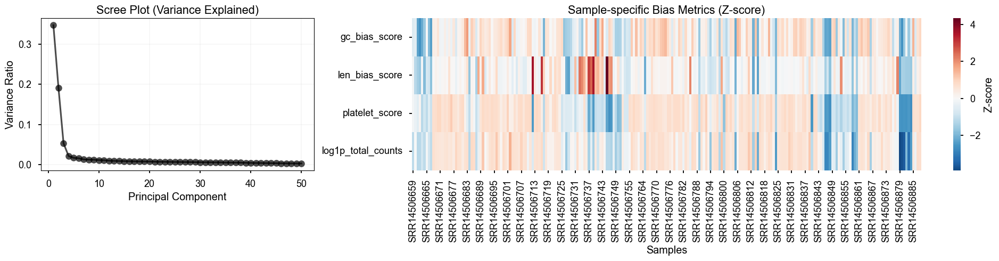

--- [Step 2-2] PCA Scatter Plots ---


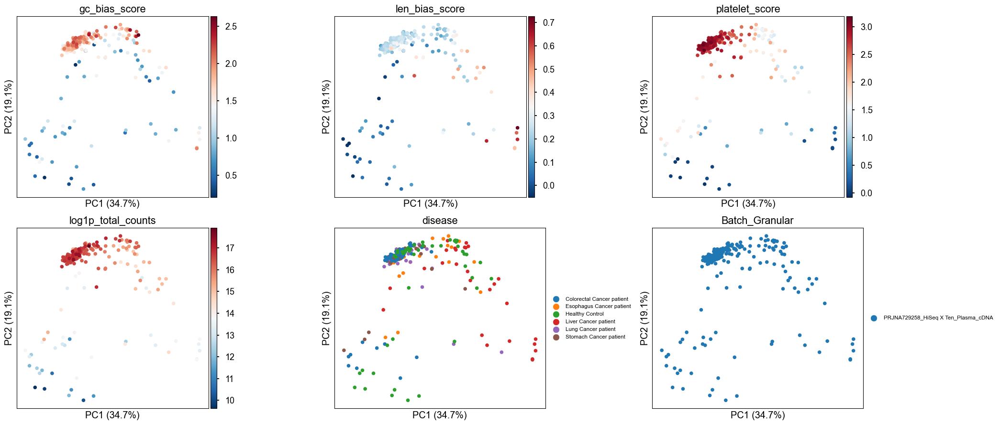

Skipping ANOVA for Batch_Granular: only one group present.


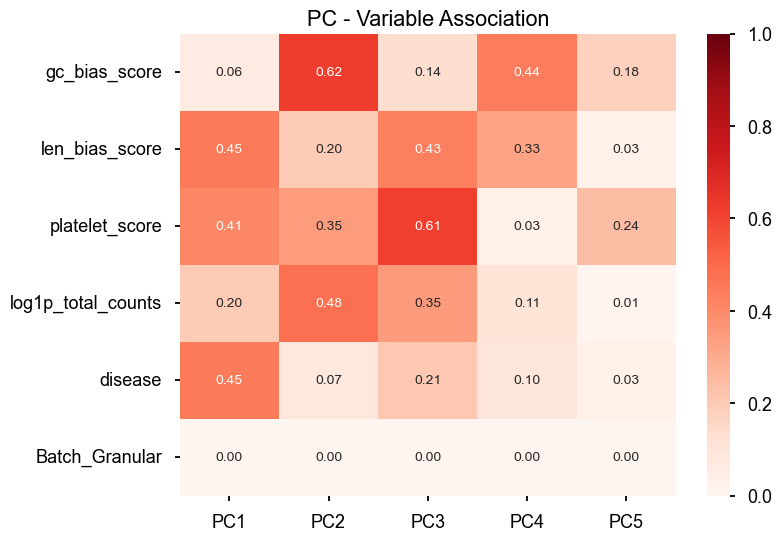

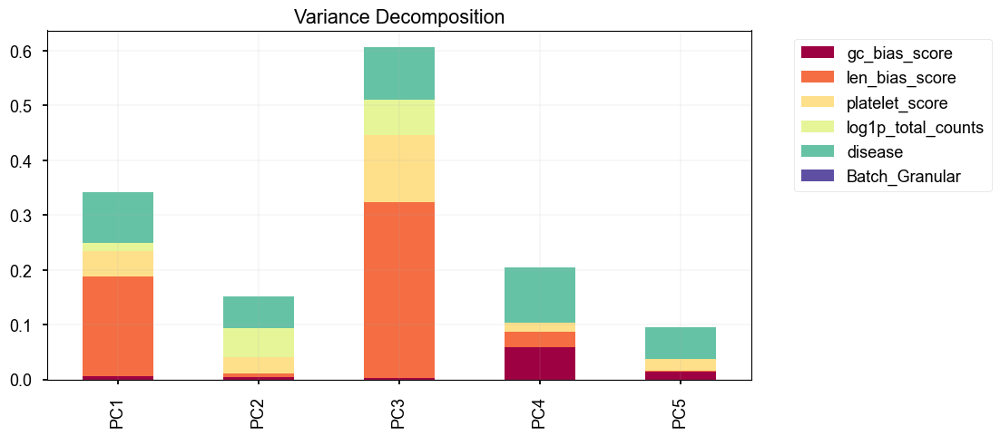

--- [Step 6] Partial Correlation Analysis ---


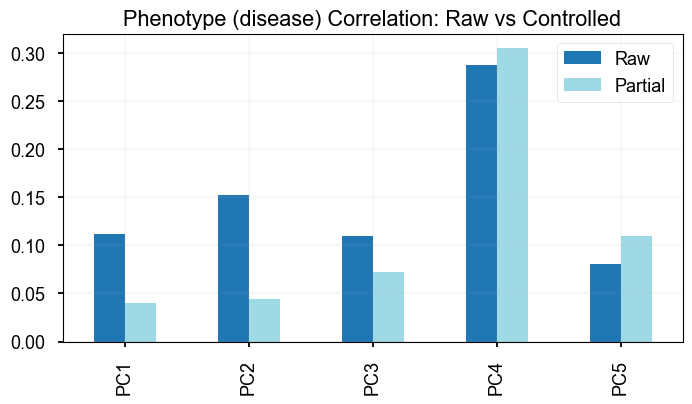

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['gc_bias_score', 'len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['platelet_score']
   -> Applying ComBat on 'Batch_Granular'


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


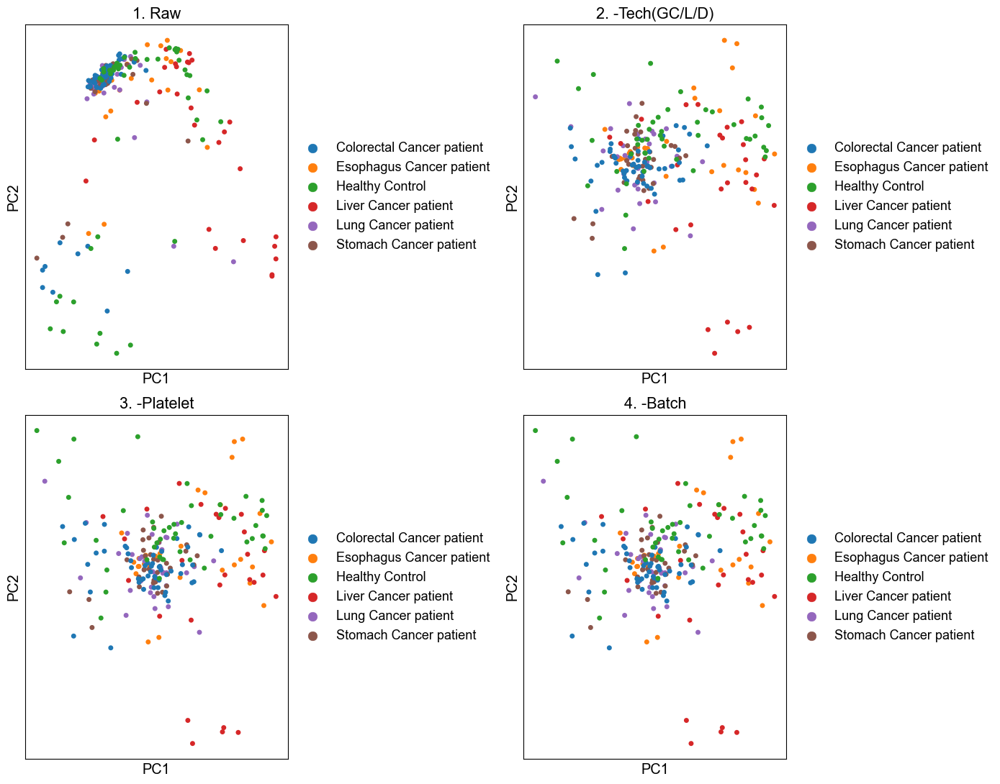

Displaying Metric Evolution (Spearman/ANOVA)...


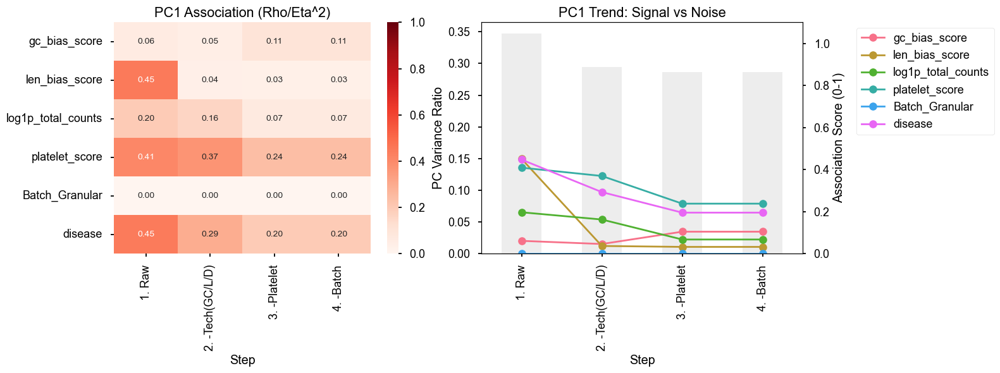

--- Finished Analysis for PRJNA729258 ---

 Processing: PRJNA758012
--- [Step 1] Preparing Metadata & Filtering ---
Filtered for ['protein_coding']: 19563 genes left.
Preparation Done.
--- Initializing: Using baseline layer 'Standard_LogCPM' for Bias Calculation ---
--- [Step] Calculating Bias Metrics ---
  > Computing GC bias score (LOESS)...
  > Computing Length bias score (Spearman)...
  > Computing Platelet scores...
Bias Metrics Calculation Done.
--- Set Layer: Switching to 'Standard_LogCPM' ---
PCA reset. Active layer is now ready for analysis.
--- Set Layer: Switching to 'Standard_LogCPM' ---
PCA reset. Active layer is now ready for analysis.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


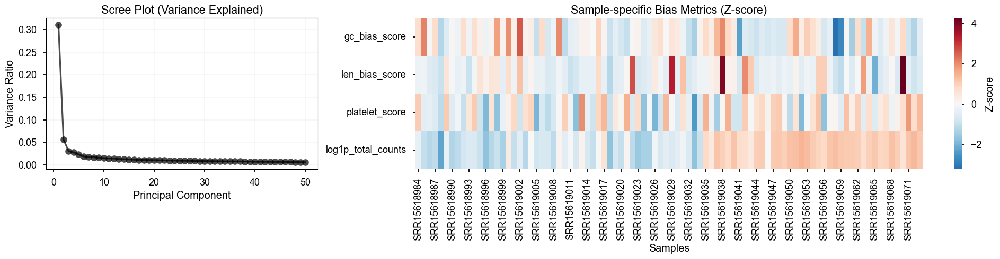

--- [Step 2-2] PCA Scatter Plots ---


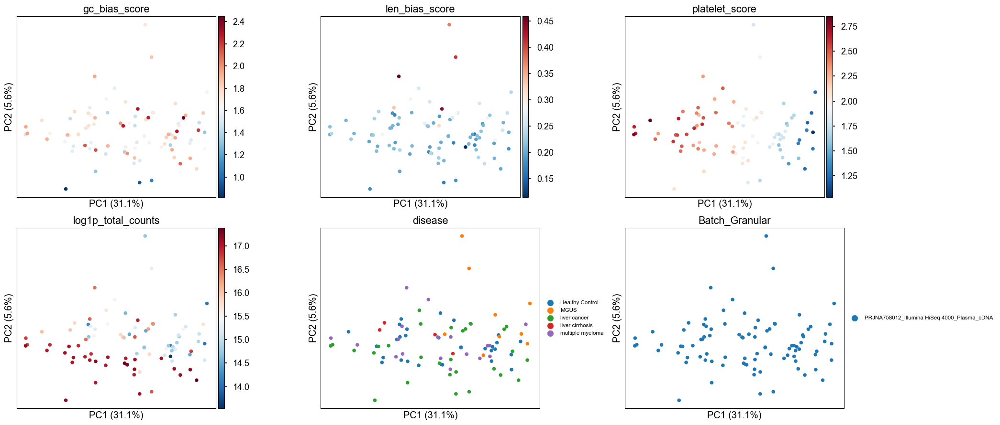

Skipping ANOVA for Batch_Granular: only one group present.


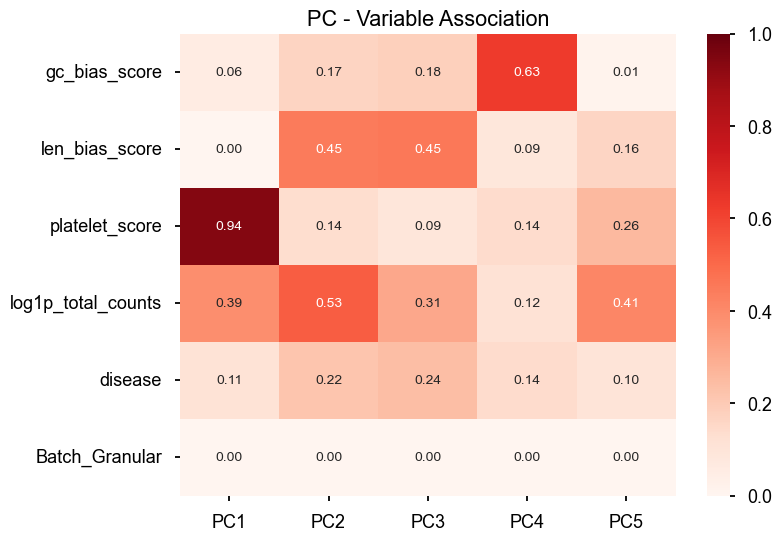

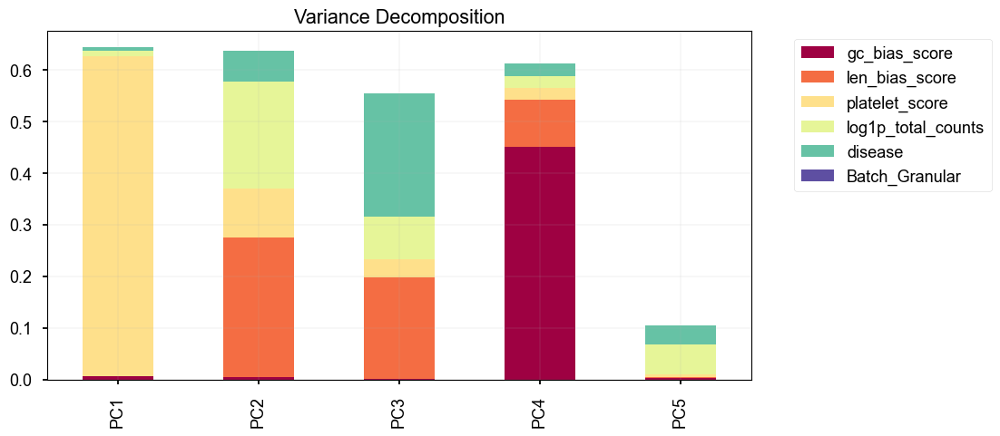

--- [Step 6] Partial Correlation Analysis ---


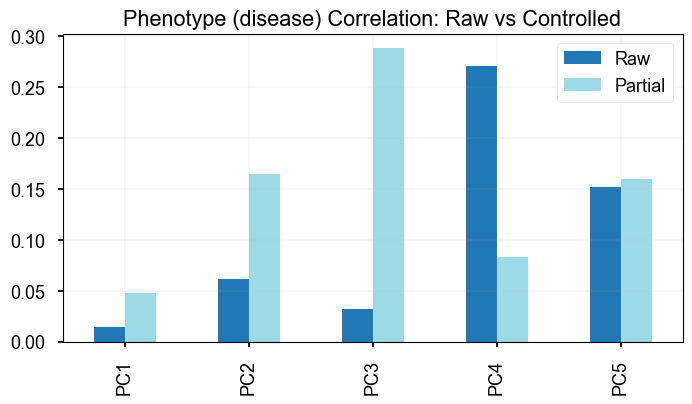

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['gc_bias_score', 'len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['platelet_score']
   -> Applying ComBat on 'Batch_Granular'


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


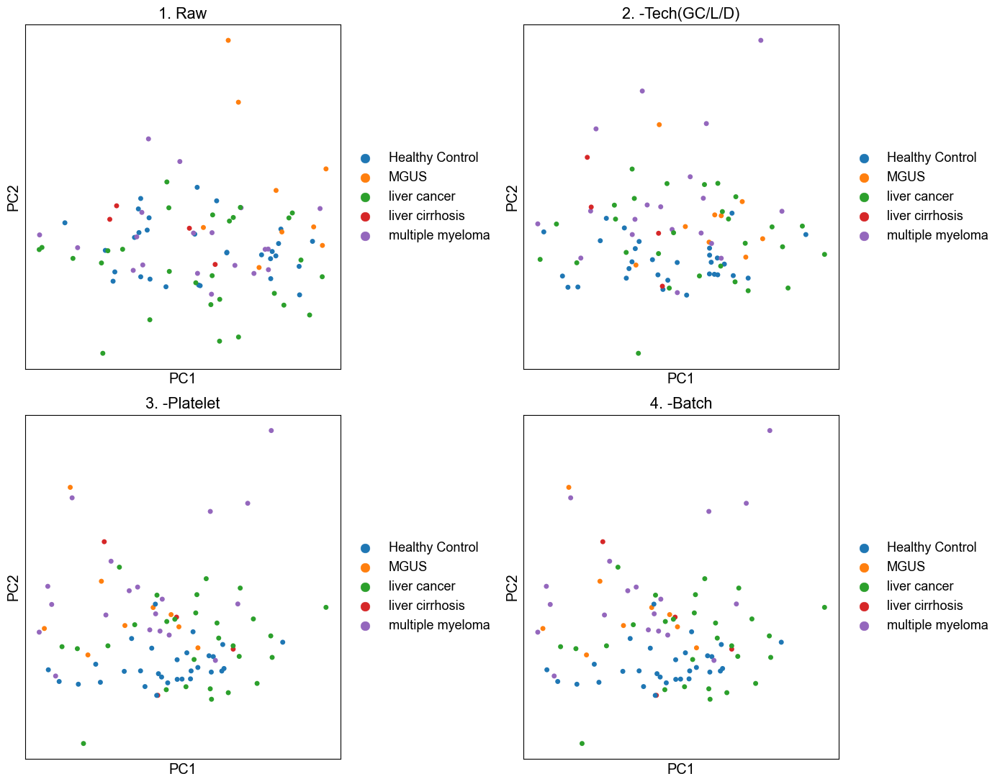

Displaying Metric Evolution (Spearman/ANOVA)...


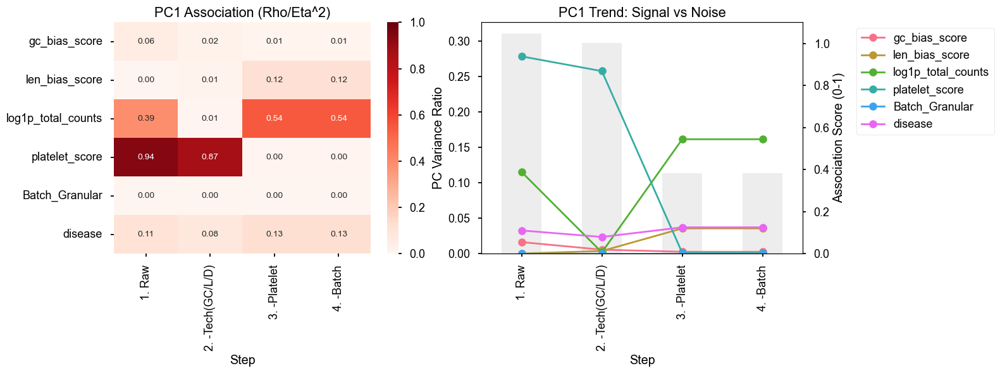

--- Finished Analysis for PRJNA758012 ---

 Processing: PRJNA1073463-1073465
--- [Step 1] Preparing Metadata & Filtering ---
Filtered for ['protein_coding']: 18680 genes left.
Preparation Done.
--- Initializing: Using baseline layer 'Standard_LogCPM' for Bias Calculation ---
--- [Step] Calculating Bias Metrics ---
  > Computing GC bias score (LOESS)...
  > Computing Length bias score (Spearman)...
  > Computing Platelet scores...
Bias Metrics Calculation Done.
--- Set Layer: Switching to 'Standard_LogCPM' ---
PCA reset. Active layer is now ready for analysis.
--- Set Layer: Switching to 'Standard_LogCPM' ---
PCA reset. Active layer is now ready for analysis.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


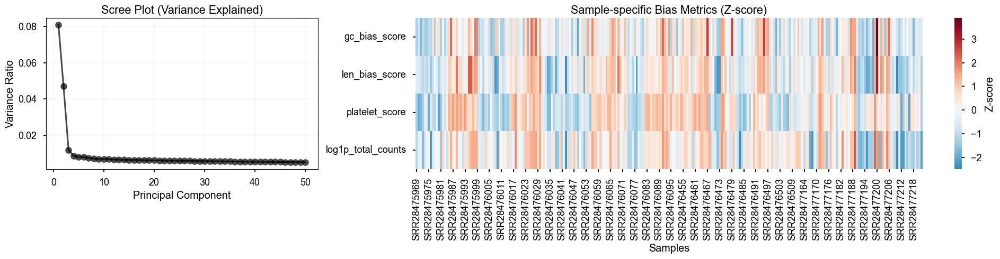

--- [Step 2-2] PCA Scatter Plots ---


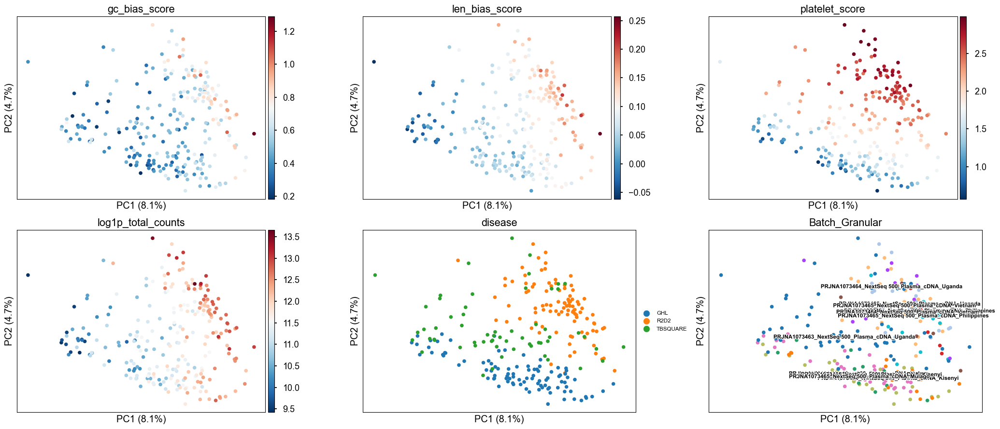

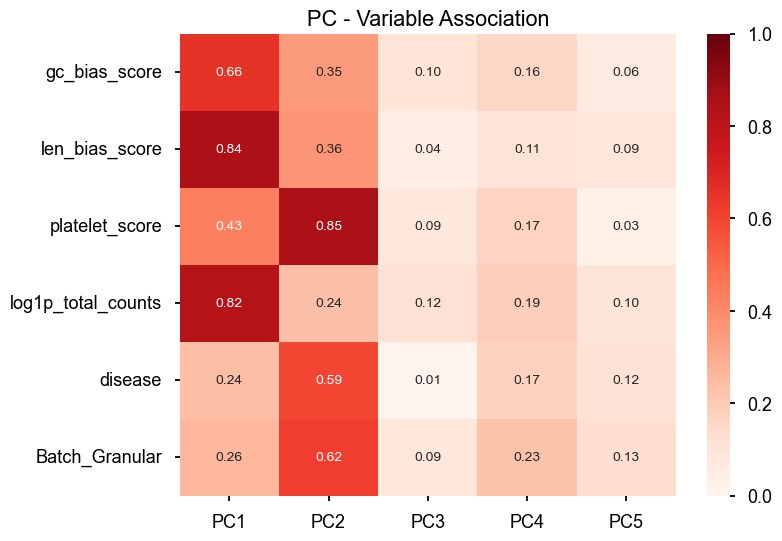

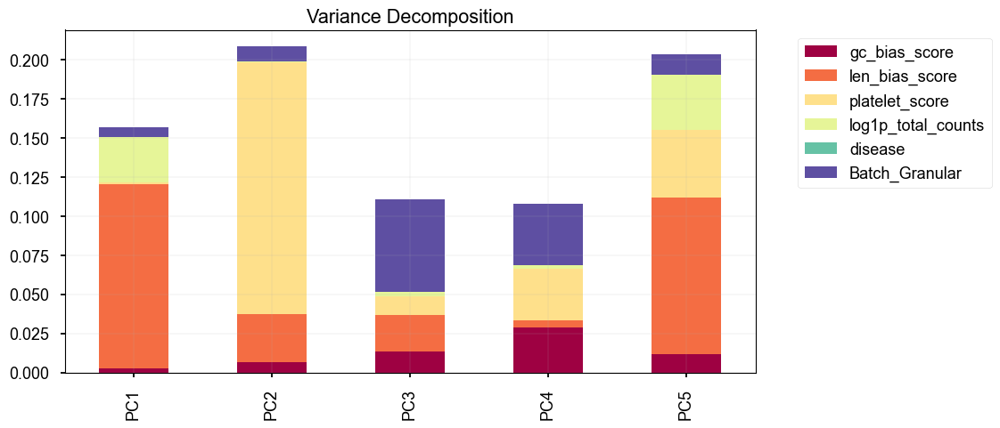

--- [Step 6] Partial Correlation Analysis ---


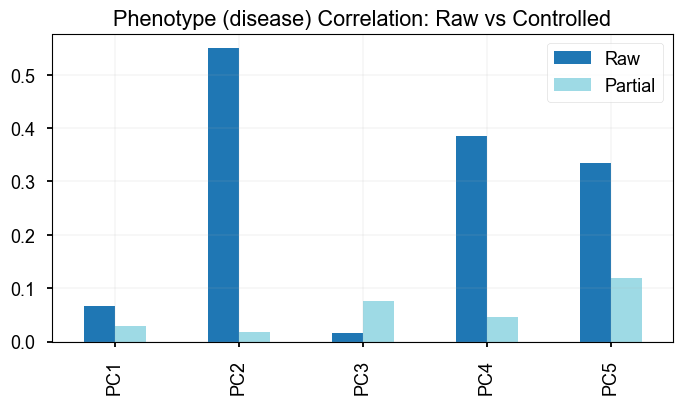

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['gc_bias_score', 'len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['platelet_score']
   -> Applying ComBat on 'Batch_Granular'


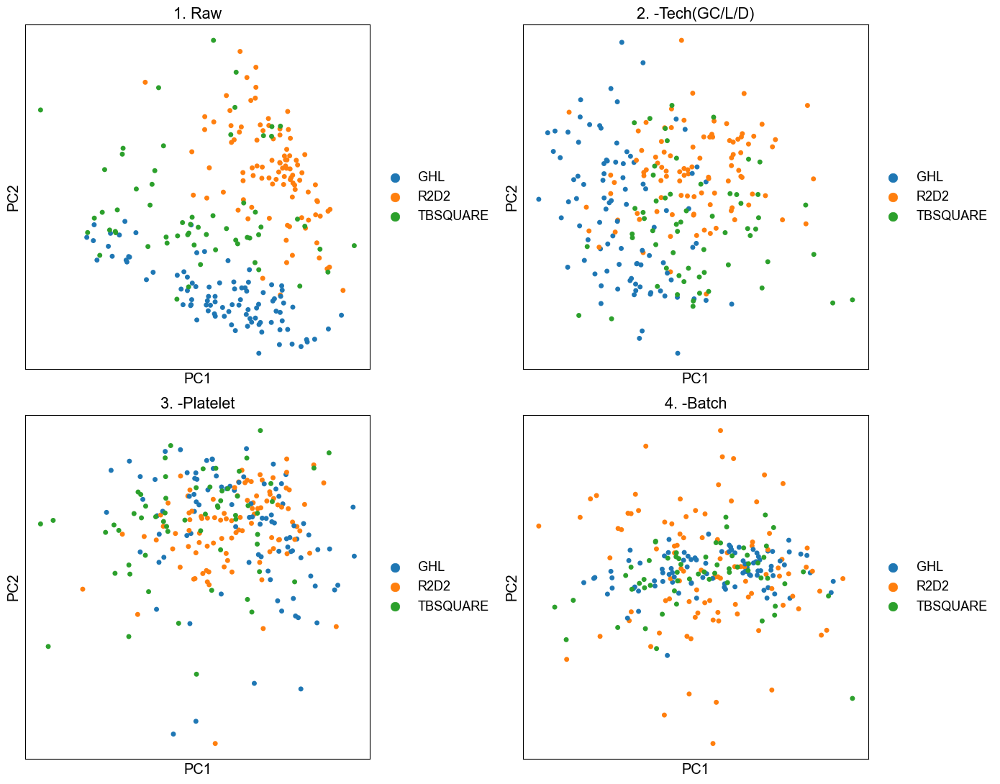

Displaying Metric Evolution (Spearman/ANOVA)...


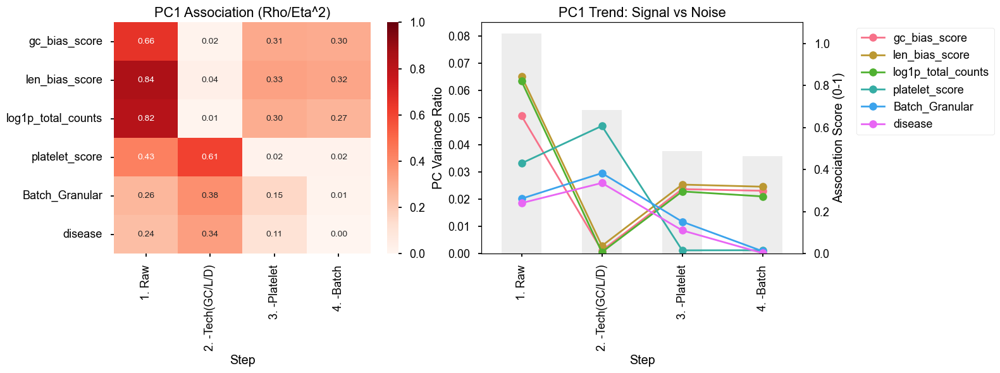

--- Finished Analysis for PRJNA1073463-1073465 ---


In [23]:
seq_ids = ['PRJNA574438', 'PRJNA701722', 'PRJNA729258', 'PRJNA758012', 'PRJNA1073463-1073465']

for sid in seq_ids:
    print(f"\n{'='*30}\n Processing: {sid}\n{'='*30}")
    adata_sub = adata[adata.obs.BioProject == sid].copy()
    sc.pp.filter_genes(adata_sub, min_cells=1)
    pipeline = RNASeqQCPipeline(
        adata=adata_sub,
        gene_type_col='GeneType',
        target_types=['protein_coding'],
        phenotype_col='disease', 
        batch_col='Batch_Granular',
        gc_col='GC_Percent',
        len_col='Length',
        platelet_col='is_platelet'
    )
    pipeline.set_layer('Standard_LogCPM')
    pipeline.run_pca_diagnostics()
    pipeline.analyze_pc_associations()
    pipeline.analyze_variance_decomposition()
    pipeline.analyze_partial_correlation()
    pipeline.run_cascade_analysis()

    print(f"--- Finished Analysis for {sid} ---")

## Replicates